# Synaptic puncta detection with Spotiflow

Detector: `Spotiflow.from_pretrained("general")` — deep stereographic-flow
spot regression (Dominguez Mantes et al., *Nat. Methods* 2025,
[doi:10.1038/s41592-025-02662-x](https://doi.org/10.1038/s41592-025-02662-x)).
The `general` model was trained across pixel sizes 0.04 to 0.34 um; our
dataset (107 nm/px, 60x) sits inside that range


What is different vs. LoG:

* Single-channel input. We run Spotiflow once per puncta channel.
* No per-spot sigma. We render fixed-radius disks per channel (radius
  derived from the same biology priors that `puncta.py` uses).
* Gating is by **probability** (Spotiflow `prob_thresh`) instead of
  annular z-score. An optional absolute-intensity floor (analogue of
  `zscore_min_inner`) suppresses dark-void firings.


## 1. Imports + repo root

In [19]:
%load_ext autoreload
%autoreload 2

import re
import sys
from pathlib import Path

NB_DIR = Path.cwd().resolve()
for p in (NB_DIR, *NB_DIR.parents):
    if (p / "src" / "synaptic_ssl").exists():
        SRC = (p / "src").resolve()
        if str(SRC) not in sys.path:
            sys.path.insert(0, str(SRC))
        break

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from skimage.morphology import dilation, disk as morph_disk

# Reused from the LoG notebook (puncta.py is NOT modified).
from synaptic_ssl.pseudolabels.puncta_common import puncta_to_mask
from synaptic_ssl.pseudolabels.dendrite_frangi import (
    DEFAULT_DENDRITE_CFG, run_dendrite_on_image,
)
from synaptic_ssl.pseudolabels.soma_fdt import DEFAULT_SOMA_CFG
from synaptic_ssl.pseudolabels.viz import (
    visualise_structural_overview,
    visualise_puncta_full,
)


from spotiflow.model import Spotiflow

print(f"src: {SRC}")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
src: /home/anokhin/anokhver/thesis/src


## 2. Configuration

Everything in one dict. `SPOTIFLOW_*` knobs replace `log_*` /
`zscore_*` from `PunctaCfg`. Disk radii (`render_radius_*`) come from
the same biology priors as `DEFAULT_PUNCTA_CFG_PRE/POST`:

* PRE bouton ~ 5-10 px at 107 nm/px -> radius ~ 4 px (diameter 8 px)
* POST PSD  ~ 2.7-5 px at 107 nm/px -> radius ~ 2 px (diameter 4 px)

In [20]:
PUNCTA_CONFIG = dict(
    # ---- Data --------------------------------------------------------
    no_patch_root="/run/media/anokhin/WinDocuments/anokhver/thesis/data/Microscopy_no_patch/20251030",
    pre_channel=0,
    post_channel=1,
    structural_channel=2,
    n_full_images=5,
    file_offset=1,

    # ---- Calibration (patches) --------------------------------------
    calib_file_index=1,
    calib_n_patches=6,
    calib_patch_size=128,
    calib_seed=0,

    # ---- Structural-mask source -------------------------------------
    struct_source="load",        # "load" | "derive"
    soma_dir="/run/media/anokhin/WinDocuments/anokhver/thesis/data/pseudolabels/soma/20251030",
    dendrite_dir="/run/media/anokhin/WinDocuments/anokhver/thesis/data/pseudolabels/dend/20251030",
    save_struct_masks=False,
    near_dilate_px=4,

    # ---- Puncta saving ----------------------------------------------
    pre_dir="/run/media/anokhin/WinDocuments/anokhver/thesis/data/pseudolabels_spotiflow/pre/20251030",
    post_dir="/run/media/anokhin/WinDocuments/anokhver/thesis/data/pseudolabels_spotiflow/post/20251030",
    save_puncta_masks=False,
    save_patch_size=128,
)

# ---- Spotiflow knobs (per channel) -----------------------------------
# prob_thresh = None lets the model use its built-in optimum (0.5 for the
# `general` checkpoint). Tighten if you see false positives; relax if
# faint puncta are missed. n_tiles=None lets spotiflow infer based on
# GPU memory; for a 2304x2304 MIP on a small GPU, set e.g. (3, 3).
SPOTIFLOW = dict(
    pretrained_model="general",
    device="auto",                # "auto" | "cuda" | "cpu" | "mps"

    # Per-channel inference knobs.
    pre_prob_thresh=None,         # None = model default
    post_prob_thresh=None,
    pre_min_distance=2,           # NMS min distance (px); ~ render radius
    post_min_distance=1,
    pre_exclude_border=False,
    post_exclude_border=False,
    n_tiles=None,                 # None = inferred; for full MIP try (3, 3)
    verbose=False,

    # Per-channel render radius (px). Drives both the saved mask disk
    # size and the viz circles. Match the biology priors in puncta.py.
    pre_render_radius=4,
    post_render_radius=2,

    # Optional absolute-intensity floor (analogue of zscore_min_inner).
    # `k * bg_sigma` above the channel background median, measured at
    # the spot centre (mean over a small disk). 0.0 disables.
    intensity_floor_k=4.0,
    intensity_inner_radius=1,     # px; mean over disk of this radius
)

# ---- Dendrite / soma derivation overrides ----------------------------
# Only consulted when struct_source == "derive". Same values as the
# LoG notebook so results are comparable.
DEND_CFG_OVERRIDES = dict(
    fuzzy_sigma=12.0,
    spur_prune_px=40,
    mu_gamma=0.3,
    dend_fdt_cfg=dict(fdt_mode="gaussian", bg_sigma_k=4.0),
    frangi_sigmas=(2.0, 2.5, 3.0, 4.0, 5.0),
    frangi_alpha=0.5,
    hysteresis_low_pct=45.0,
    small_cc_area=300,
    small_cc_proximity_px=30,
    border_rescue_min_area=400,
    border_rescue_min_axis=30,
    border_pad=15,
)
SOMA_CFG_OVERRIDES: dict = {}

## 3. Image stats + background floors

Per-channel background median + sigma, used to derive the
absolute-intensity floor (`intensity_floor_k * bg_sigma`).

In [21]:
def _channel_stats(img2d, name):
    bg = img2d[img2d <= np.percentile(img2d, 30)]
    med = float(np.median(bg))
    mad = float(np.median(np.abs(bg - med)))
    sigma = 1.4826 * mad
    p99 = float(np.percentile(img2d, 99))
    print(f"  {name:>10s}: bg_med={med:.4f}  bg_sigma={sigma:.4f}  "
          f"p99={p99:.3f}  floor@k={SPOTIFLOW['intensity_floor_k']}="
          f"{med + SPOTIFLOW['intensity_floor_k'] * sigma:.3f}")
    return dict(bg=med, sigma=sigma, p99=p99)


_files = sorted(Path(PUNCTA_CONFIG["no_patch_root"]).glob("*.npy"))
if not _files:
    raise FileNotFoundError(f"no .npy MIPs under {PUNCTA_CONFIG['no_patch_root']}")
print(f"n_files = {len(_files)}")
print(f"calib file [{PUNCTA_CONFIG['calib_file_index']}] = "
      f"{_files[PUNCTA_CONFIG['calib_file_index']].name}")

_img = np.load(_files[PUNCTA_CONFIG["calib_file_index"]]).astype(np.float32)
print(f"shape = {_img.shape}  dtype = {_img.dtype}")
print("\nPer-channel stats:")
_stats_pre  = _channel_stats(_img[PUNCTA_CONFIG["pre_channel"]],  "pre (ch0)")
_stats_post = _channel_stats(_img[PUNCTA_CONFIG["post_channel"]], "post (ch1)")
_channel_stats(_img[PUNCTA_CONFIG["structural_channel"]], "struct(ch2)")

FLOOR_PRE  = _stats_pre["bg"]  + SPOTIFLOW["intensity_floor_k"] * _stats_pre["sigma"]
FLOOR_POST = _stats_post["bg"] + SPOTIFLOW["intensity_floor_k"] * _stats_post["sigma"]
print(f"\nintensity floors:  pre>={FLOOR_PRE:.4f}  post>={FLOOR_POST:.4f}")

n_files = 68
calib file [1] = 2_2_PSI_3010_Multichannel Z-Stack_20251030_51.npy
shape = (3, 2304, 2304)  dtype = float32

Per-channel stats:
   pre (ch0): bg_med=0.0291  bg_sigma=0.0162  p99=0.668  floor@k=4.0=0.094
  post (ch1): bg_med=0.0386  bg_sigma=0.0229  p99=0.654  floor@k=4.0=0.130
  struct(ch2): bg_med=0.0620  bg_sigma=0.0345  p99=0.736  floor@k=4.0=0.200

intensity floors:  pre>=0.0940  post>=0.1302


## 4. Load Spotiflow model

Single shared model for both channels (the `general` checkpoint is
single-channel and modality-agnostic). Default cache is `~/.spotiflow`;
override with `SPOTIFLOW_CACHE_DIR` if disk space matters.

In [22]:
MODEL = Spotiflow.from_pretrained(SPOTIFLOW["pretrained_model"])
print(f"loaded: {SPOTIFLOW['pretrained_model']}  "
      f"is_3d={MODEL.config.is_3d}  "
      f"in_channels={MODEL.config.in_channels}  "
      f"out_channels={MODEL.config.out_channels}")

INFO:spotiflow.model.spotiflow:Loading pretrained model: general
loaded: general  is_3d=False  in_channels=1  out_channels=1


## 5. Helpers

I/O + structural-mask construction are copies of the LoG notebook
(same on-disk patch convention, same `near_mask` dilation). The
Spotiflow-specific bit is `detect_spots_spotiflow` +
`filter_by_intensity` + a small `(N,2)` -> `(N,3)` adapter so we can
reuse `puncta_to_mask` and `visualise_puncta_full` unchanged.

In [23]:
# ---- I/O helpers (patch tiling / stitching) --------------------------
# Same on-disk convention as scripts/pseudolabels/*_from_mip.py:
#   {stem}_r{rr:02d}_c{cc:02d}_{kind}.npy   with kind in {soma, dend, pre, post}

_PATCH_RE = re.compile(r"_r(\d{2})_c(\d{2})(?:_[a-z]+)?\.npy$")

def _tile_and_save(arr2d, out_dir, stem, patch_size, *, kind, dtype=np.uint8):
    H, W = arr2d.shape
    if H % patch_size or W % patch_size:
        raise ValueError(
            f"image ({H}, {W}) not divisible by save_patch_size={patch_size}"
        )
    nr, nc = H // patch_size, W // patch_size
    out_dir_p = Path(out_dir); out_dir_p.mkdir(parents=True, exist_ok=True)
    for rr in range(nr):
        for cc in range(nc):
            tile = arr2d[rr*patch_size:(rr+1)*patch_size,
                         cc*patch_size:(cc+1)*patch_size]
            np.save(out_dir_p / f"{stem}_r{rr:02d}_c{cc:02d}_{kind}.npy",
                    tile.astype(dtype))
    return nr * nc

def _stitch_patches(out_dir, stem, full_shape, *, kind, dtype=bool):
    H, W = full_shape
    pattern = f"{stem}_r??_c??_{kind}.npy"
    files = sorted(Path(out_dir).glob(pattern))
    if not files:
        raise FileNotFoundError(
            f"no patch files matching {pattern} in {out_dir}"
        )
    first = np.load(files[0])
    ps = first.shape[0]
    nr, nc = H // ps, W // ps
    if len(files) != nr * nc:
        raise ValueError(
            f"expected {nr*nc} patches ({nr}x{nc} at ps={ps}) for {stem}, "
            f"got {len(files)}"
        )
    out = np.zeros((H, W), dtype=dtype)
    for fp in files:
        m = _PATCH_RE.search(fp.name)
        rr, cc = int(m.group(1)), int(m.group(2))
        out[rr*ps:(rr+1)*ps, cc*ps:(cc+1)*ps] = np.load(fp).astype(dtype)
    return out


# ---- Structural mask builders ----------------------------------------

def _bubble_dend_cfg(overrides):
    out = dict(overrides)
    single = {"fuzzy_sigma": "fuzzy_sigma", "dend_mu_gamma": "mu_gamma"}
    extra = {tgt: out.pop(src) for src, tgt in single.items() if src in out}
    if extra:
        out["dend_fdt_cfg"] = {**(out.get("dend_fdt_cfg") or {}), **extra}
    return out

def build_structural_from_disk(path, cfg, *, full_shape=None):
    if full_shape is None:
        full_shape = np.load(path).shape[-2:]
    soma = _stitch_patches(cfg["soma_dir"],     path.stem, full_shape, kind="soma", dtype=bool)
    dend = _stitch_patches(cfg["dendrite_dir"], path.stem, full_shape, kind="dend", dtype=bool)
    return dict(soma_mask=soma, dendrite_mask=dend, source="load")

def build_structural_derive(path, cfg):
    bub = _bubble_dend_cfg(DEND_CFG_OVERRIDES)
    soma_extra = dict(SOMA_CFG_OVERRIDES)
    soma_keys = set(DEFAULT_SOMA_CFG.keys())
    soma_cfg = {k: v for k, v in bub.items() if k in soma_keys} | soma_extra
    dend_cfg = {k: v for k, v in bub.items()
                if k in DEFAULT_DENDRITE_CFG or k == "dend_fdt_cfg"}
    dend_fdt_cfg = dend_cfg.pop("dend_fdt_cfg", None)
    _, _, soma_info, dend_info = run_dendrite_on_image(
        path,
        cfg=dend_cfg,
        soma_cfg=soma_cfg,
        dend_fdt_cfg=dend_fdt_cfg,
        structural_channel=cfg["structural_channel"],
    )
    return dict(
        soma_mask=soma_info["mask"].astype(bool),
        dendrite_mask=dend_info["trace"].astype(bool),
        source="derive",
        soma_info=soma_info, dend_info=dend_info,
    )

def build_structural(path, cfg, *, full_shape=None):
    if cfg["struct_source"] == "load":
        s = build_structural_from_disk(path, cfg, full_shape=full_shape)
    elif cfg["struct_source"] == "derive":
        s = build_structural_derive(path, cfg)
    else:
        raise ValueError(f"struct_source must be 'load' or 'derive', got {cfg['struct_source']!r}")
    structural = s["soma_mask"] | s["dendrite_mask"]
    s["structural_mask"] = structural
    s["near_mask"] = dilation(structural, morph_disk(int(cfg["near_dilate_px"])))
    return s


# ---- Spotiflow detection --------------------------------------------
# Thin wrappers around `synaptic_ssl.pseudolabels.puncta_spotiflow`; kept
# here so the calibration + full-image cells below stay one-liner-driven.

from synaptic_ssl.pseudolabels.puncta_spotiflow import (
    detect_spots_spotiflow as _detect_spots_pkg,
    filter_by_intensity,
    spots_to_blobs,
    SpotiflowPunctaCfg,
)

def detect_spots_spotiflow(
    img2d, model, *,
    prob_thresh=None,
    min_distance=1,
    exclude_border=False,
    n_tiles=None,
    device="auto",
    verbose=False,
):
    cfg = SpotiflowPunctaCfg(
        prob_thresh=prob_thresh,
        min_distance=int(min_distance),
        exclude_border=bool(exclude_border),
        n_tiles=n_tiles,
        device=device,
        verbose=bool(verbose),
    )
    points, prob = _detect_spots_pkg(img2d, model, cfg)
    return points, prob, None


def restrict_spots_to_near(points, near_mask):
    # 2D `(N, 2)` analogue of puncta_common.restrict_puncta_to_near
    # (which expects `(N, 3)`). Kept local to the notebook because the
    # full-image cell below applies it before spots_to_blobs.
    if len(points) == 0:
        return points
    H, W = near_mask.shape
    rr = np.clip(np.round(points[:, 0]).astype(int), 0, H - 1)
    cc = np.clip(np.round(points[:, 1]).astype(int), 0, W - 1)
    return points[near_mask[rr, cc].astype(bool)]


# ---- Calibration sampling -------------------------------------------

def sample_patches(img, n, size, seed):
    rng = np.random.default_rng(seed)
    if img.ndim == 2:
        H, W = img.shape; img3 = img[None]
    elif img.ndim == 3:
        _, H, W = img.shape; img3 = img
    else:
        raise ValueError(f"sample_patches expects 2D or 3D, got {img.shape}")
    if size > H or size > W:
        raise ValueError(f"calib_patch_size={size} larger than image ({H}, {W})")
    out = []
    for _ in range(n):
        y = int(rng.integers(0, H - size + 1))
        x = int(rng.integers(0, W - size + 1))
        out.append((y, x, img3[:, y:y + size, x:x + size]))
    return out


# ---- Mask saving -----------------------------------------------------

def maybe_save_struct(path, struct, cfg):
    if not (cfg.get("save_struct_masks") and struct.get("source") == "derive"):
        return 0
    ps = int(cfg["save_patch_size"])
    n  = _tile_and_save(struct["soma_mask"],     cfg["soma_dir"],     path.stem, ps, kind="soma")
    n += _tile_and_save(struct["dendrite_mask"], cfg["dendrite_dir"], path.stem, ps, kind="dend")
    return n

def maybe_save_puncta(path, pre_mask, post_mask, cfg):
    if not cfg.get("save_puncta_masks"):
        return 0
    ps = int(cfg["save_patch_size"])
    n  = _tile_and_save(pre_mask,  cfg["pre_dir"],  path.stem, ps, kind="pre")
    n += _tile_and_save(post_mask, cfg["post_dir"], path.stem, ps, kind="post")
    return n

## 6. Calibration on random patches

Same idea as the LoG notebook: tune `prob_thresh` and the intensity
floor in isolation (no structural gate). Random patches may not
contain bright structure -- rerun with a different `calib_seed` if so.

Spotiflow was trained on full-size crops; running it on tiny 128x128
patches works (`normalizer="auto"` per-tile) but the per-tile
normalisation can drift vs. the full-image stats. For final pipeline
output use the full-MIP cell below.

calibration image: 2_2_PSI_3010_Multichannel Z-Stack_20251030_51.npy  shape=(3, 2304, 2304)
  sampled 6 patches of 128^2 (seed=0)
  patch [0] @ (y=1851, x=1386)  pre raw= 99 kept= 85  post raw= 34 kept= 34


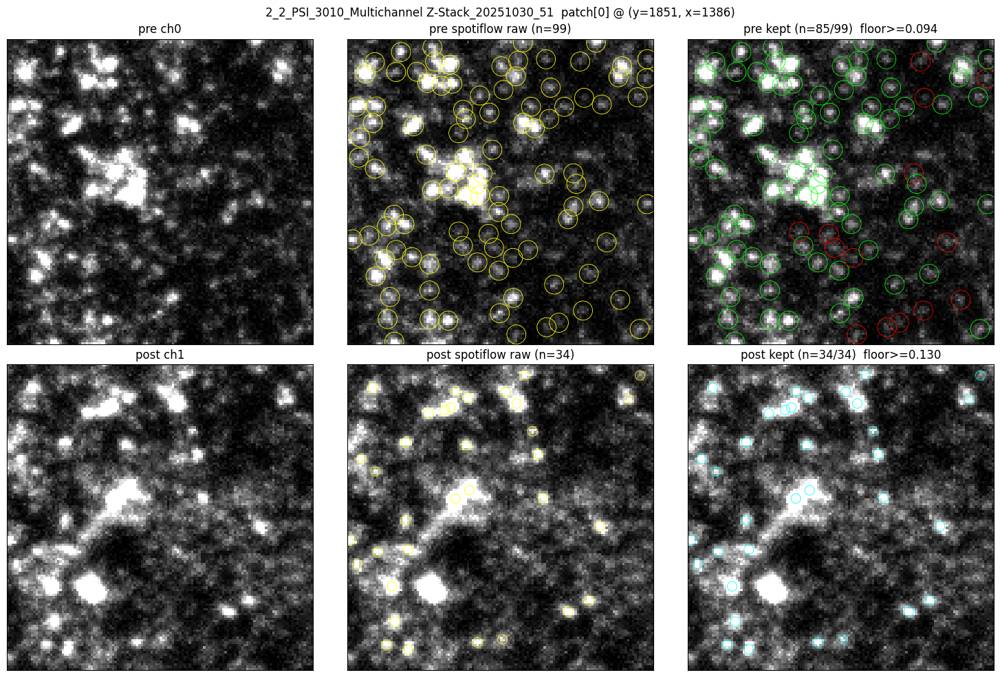

  patch [1] @ (y=1112, x=587)  pre raw= 85 kept= 85  post raw= 62 kept= 62


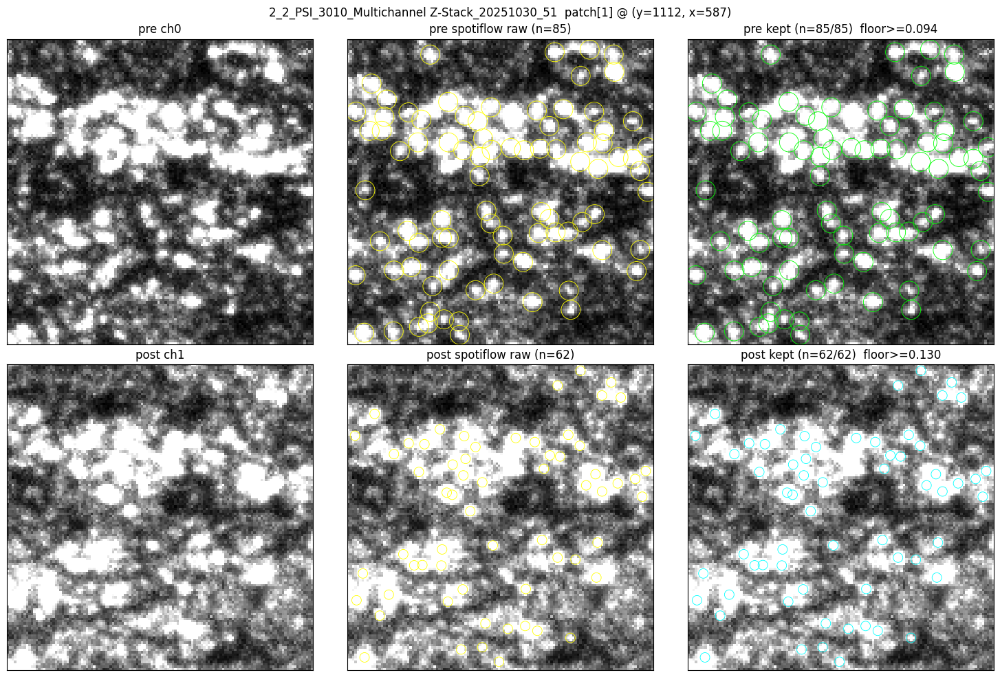

  patch [2] @ (y=670, x=89)  pre raw= 57 kept= 57  post raw= 33 kept= 33


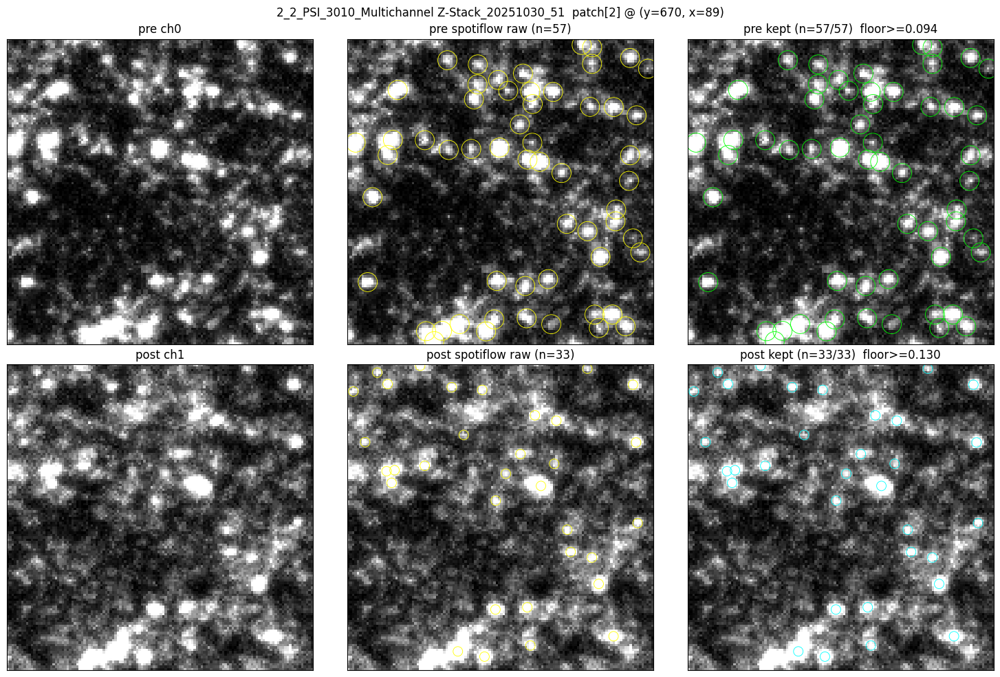

  patch [3] @ (y=163, x=35)  pre raw= 74 kept= 73  post raw= 26 kept= 26


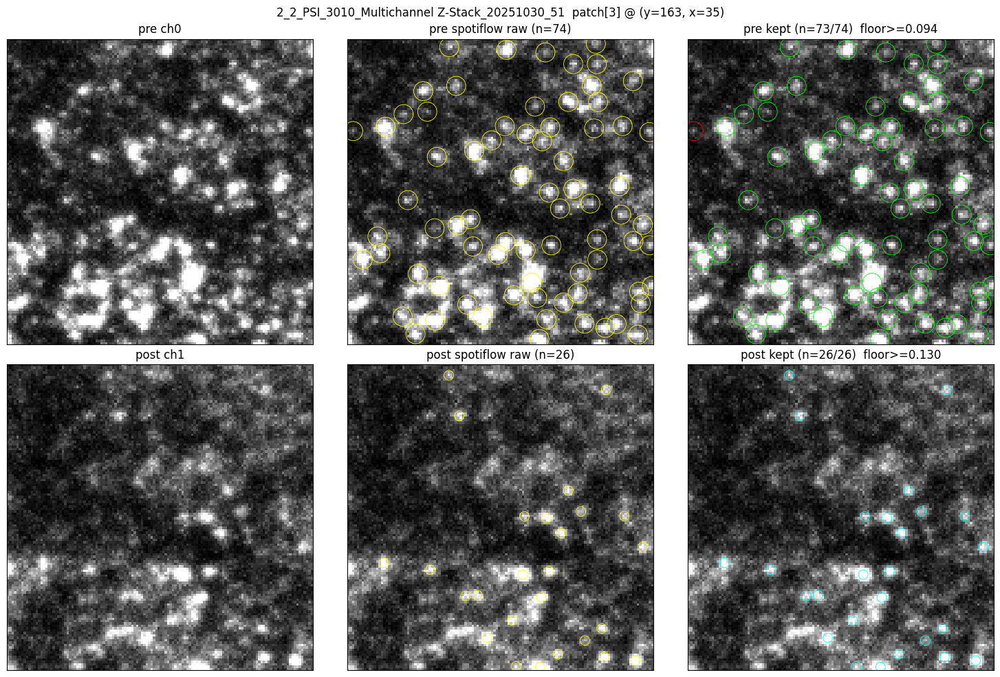

  patch [4] @ (y=381, x=1770)  pre raw= 67 kept= 66  post raw= 95 kept= 95


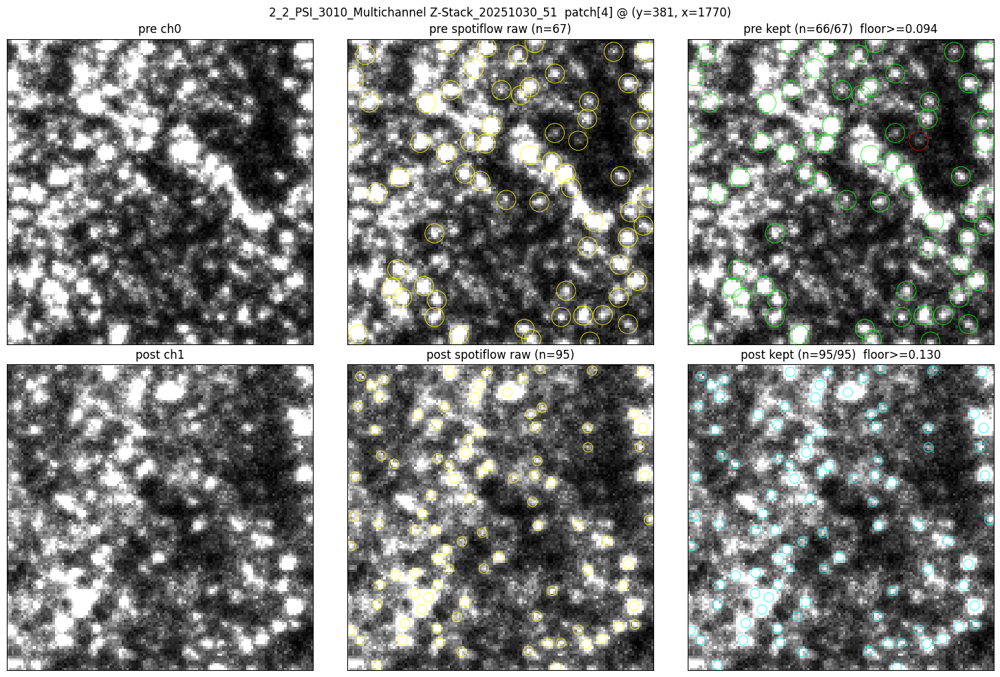

  patch [5] @ (y=1413, x=1987)  pre raw=101 kept=100  post raw= 60 kept= 57


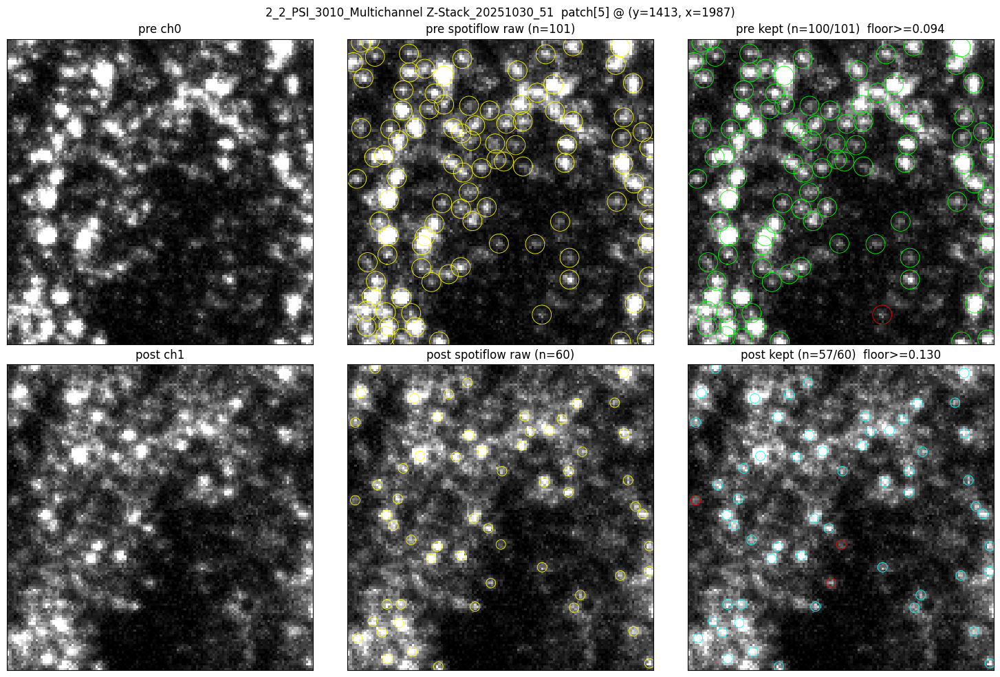

In [24]:
calib_path = _files[PUNCTA_CONFIG["calib_file_index"]]
calib_img  = np.load(calib_path).astype(np.float32)
patches = sample_patches(
    calib_img,
    PUNCTA_CONFIG["calib_n_patches"],
    PUNCTA_CONFIG["calib_patch_size"],
    PUNCTA_CONFIG["calib_seed"],
)
print(f"calibration image: {calib_path.name}  shape={calib_img.shape}")
print(f"  sampled {len(patches)} patches of {PUNCTA_CONFIG['calib_patch_size']}^2 "
      f"(seed={PUNCTA_CONFIG['calib_seed']})")


def viz_spotiflow_patch(patch, pre_pts, pre_kept, post_pts, post_kept,
                        *, pre_ch, post_ch, r_pre, r_post,
                        floor_pre, floor_post, vmax=0.3, title=""):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    for row, (name, ch, pts, kept, color, r, floor) in enumerate([
        ("pre",  pre_ch,  pre_pts,  pre_kept,  "lime", r_pre,  floor_pre),
        ("post", post_ch, post_pts, post_kept, "cyan", r_post, floor_post),
    ]):
        img = patch[ch]
        axes[row, 0].imshow(img, cmap="gray", vmin=0, vmax=vmax)
        axes[row, 0].set_title(f"{name} ch{ch}")
        axes[row, 1].imshow(img, cmap="gray", vmin=0, vmax=vmax)
        for y, x in pts:
            axes[row, 1].add_patch(Circle((x, y), r, fill=False,
                                          edgecolor="yellow", linewidth=0.6))
        axes[row, 1].set_title(f"{name} spotiflow raw (n={len(pts)})")
        axes[row, 2].imshow(img, cmap="gray", vmin=0, vmax=vmax)
        kept_set = {(round(y, 3), round(x, 3)) for y, x in kept}
        for y, x in pts:
            on = (round(y, 3), round(x, 3)) in kept_set
            axes[row, 2].add_patch(Circle(
                (x, y), r, fill=False,
                edgecolor=color if on else "red", linewidth=0.6,
            ))
        axes[row, 2].set_title(
            f"{name} kept (n={len(kept)}/{len(pts)})  floor>={floor:.3f}"
        )
    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])
    if title:
        fig.suptitle(title)
    plt.tight_layout()
    return fig


for i, (y0, x0, patch) in enumerate(patches):
    pre  = patch[PUNCTA_CONFIG["pre_channel"]]
    post = patch[PUNCTA_CONFIG["post_channel"]]
    pre_pts,  _, _ = detect_spots_spotiflow(
        pre, MODEL,
        prob_thresh=SPOTIFLOW["pre_prob_thresh"],
        min_distance=SPOTIFLOW["pre_min_distance"],
        exclude_border=SPOTIFLOW["pre_exclude_border"],
        device=SPOTIFLOW["device"], verbose=SPOTIFLOW["verbose"],
    )
    post_pts, _, _ = detect_spots_spotiflow(
        post, MODEL,
        prob_thresh=SPOTIFLOW["post_prob_thresh"],
        min_distance=SPOTIFLOW["post_min_distance"],
        exclude_border=SPOTIFLOW["post_exclude_border"],
        device=SPOTIFLOW["device"], verbose=SPOTIFLOW["verbose"],
    )
    keep_pre  = filter_by_intensity(pre,  pre_pts,
                                    min_inner=FLOOR_PRE,
                                    radius=SPOTIFLOW["intensity_inner_radius"])
    keep_post = filter_by_intensity(post, post_pts,
                                    min_inner=FLOOR_POST,
                                    radius=SPOTIFLOW["intensity_inner_radius"])
    pre_kept  = pre_pts[keep_pre]
    post_kept = post_pts[keep_post]
    print(f"  patch [{i}] @ (y={y0}, x={x0})  "
          f"pre raw={len(pre_pts):3d} kept={len(pre_kept):3d}  "
          f"post raw={len(post_pts):3d} kept={len(post_kept):3d}")
    viz_spotiflow_patch(
        patch, pre_pts, pre_kept, post_pts, post_kept,
        pre_ch=PUNCTA_CONFIG["pre_channel"],
        post_ch=PUNCTA_CONFIG["post_channel"],
        r_pre=SPOTIFLOW["pre_render_radius"],
        r_post=SPOTIFLOW["post_render_radius"],
        floor_pre=FLOOR_PRE, floor_post=FLOOR_POST,
        title=f"{calib_path.stem}  patch[{i}] @ (y={y0}, x={x0})",
    )
    plt.show()

## 7. Full-image processing

For each of the first `n_full_images` MIPs (offset by `file_offset` so
calibration is not re-evaluated):

1. Build / load the structural near-mask (soma U dendrite, dilated).
2. Run Spotiflow on the full pre and post channels.
3. Gate by intensity floor, then by `near_mask`.
4. Render mask via `puncta_to_mask` and visualise via `visualise_puncta_full`.
5. Optionally tile-save under `pre_dir` / `post_dir`.

processing 5 images (5..9) from /run/media/anokhin/WinDocuments/anokhver/thesis/data/Microscopy_no_patch/20251030
[1/5] 2_2_PSI_30_10_5_Multichannel Z-Stack_20251030_55.npy  near=17.6%  pre 10248->1388  post 10135->1502  saved struct=0 punct=0  (5.2s)


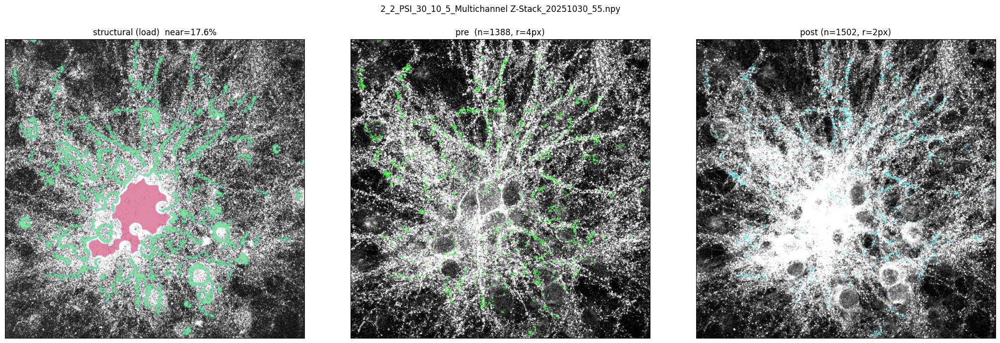

[2/5] 2_3_PSYHARMIN_10_Multichannel Z-Stack_20251030_75.npy  near=18.2%  pre 10501->1886  post 11206->2404  saved struct=0 punct=0  (5.2s)


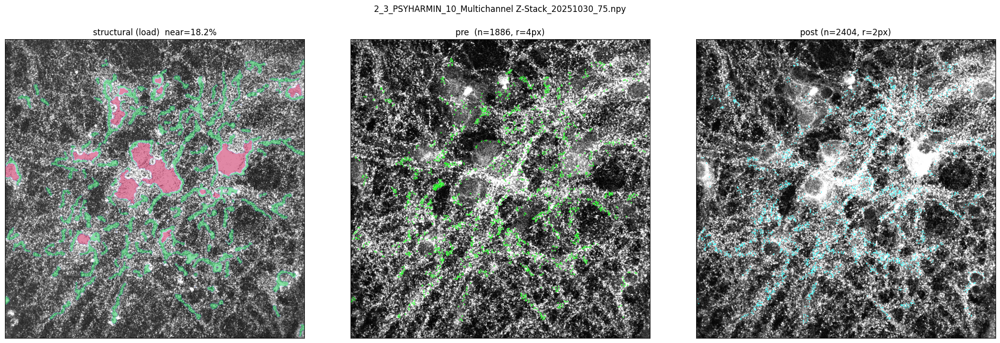

[3/5] 2_3_PSYHARMIN_1_Multichannel Z-Stack_20251030_66.npy  near=18.3%  pre 8405->1360  post 11100->2725  saved struct=0 punct=0  (5.3s)


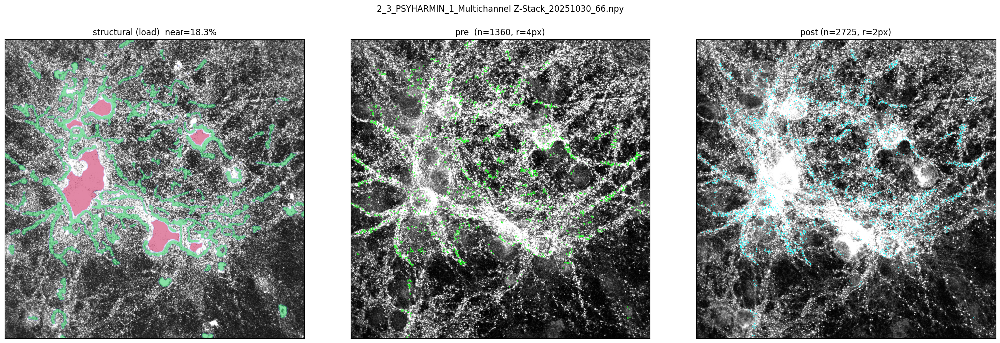

[4/5] 2_3_PSYHARMIN_2_Multichannel Z-Stack_20251030_67.npy  near=18.2%  pre 9962->1498  post 10588->2529  saved struct=0 punct=0  (5.2s)


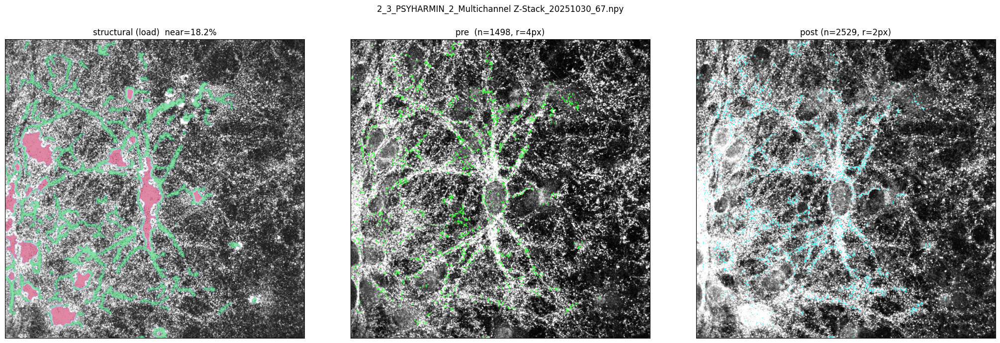

[5/5] 2_3_PSYHARMIN_3_Multichannel Z-Stack_20251030_68.npy  near=21.1%  pre 12454->4122  post 8269->2985  saved struct=0 punct=0  (5.4s)


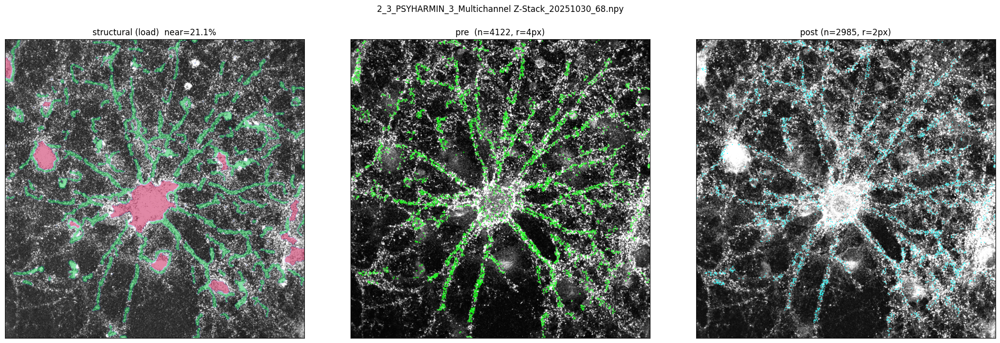

In [25]:
import time

start = 4 + PUNCTA_CONFIG["file_offset"]
stop  = start + PUNCTA_CONFIG["n_full_images"]
batch_files = _files[start:stop]
print(f"processing {len(batch_files)} images "
      f"({start}..{stop - 1}) from {PUNCTA_CONFIG['no_patch_root']}")

for j, path in enumerate(batch_files):
    t0 = time.time()
    img = np.load(path).astype(np.float32)
    H, W = img.shape[-2:]

    struct = build_structural(path, PUNCTA_CONFIG, full_shape=(H, W))
    near = struct["near_mask"]
    near_pct = 100.0 * near.mean()

    pre  = img[PUNCTA_CONFIG["pre_channel"]]
    post = img[PUNCTA_CONFIG["post_channel"]]

    pre_pts,  pre_prob,  _ = detect_spots_spotiflow(
        pre, MODEL,
        prob_thresh=SPOTIFLOW["pre_prob_thresh"],
        min_distance=SPOTIFLOW["pre_min_distance"],
        exclude_border=SPOTIFLOW["pre_exclude_border"],
        n_tiles=SPOTIFLOW["n_tiles"],
        device=SPOTIFLOW["device"], verbose=SPOTIFLOW["verbose"],
    )
    post_pts, post_prob, _ = detect_spots_spotiflow(
        post, MODEL,
        prob_thresh=SPOTIFLOW["post_prob_thresh"],
        min_distance=SPOTIFLOW["post_min_distance"],
        exclude_border=SPOTIFLOW["post_exclude_border"],
        n_tiles=SPOTIFLOW["n_tiles"],
        device=SPOTIFLOW["device"], verbose=SPOTIFLOW["verbose"],
    )

    # Intensity floor (absolute), then structural near-mask.
    keep_pre  = filter_by_intensity(pre,  pre_pts,  min_inner=FLOOR_PRE,
                                    radius=SPOTIFLOW["intensity_inner_radius"])
    keep_post = filter_by_intensity(post, post_pts, min_inner=FLOOR_POST,
                                    radius=SPOTIFLOW["intensity_inner_radius"])
    pre_pts  = pre_pts[keep_pre]
    post_pts = post_pts[keep_post]

    n_pre_pre_gate, n_post_pre_gate = len(pre_pts), len(post_pts)
    pre_pts  = restrict_spots_to_near(pre_pts,  near)
    post_pts = restrict_spots_to_near(post_pts, near)

    pre_blobs  = spots_to_blobs(pre_pts,  SPOTIFLOW["pre_render_radius"])
    post_blobs = spots_to_blobs(post_pts, SPOTIFLOW["post_render_radius"])
    pre_mask   = puncta_to_mask(pre_blobs,  (H, W))
    post_mask  = puncta_to_mask(post_blobs, (H, W))

    n_struct = maybe_save_struct(path, struct, PUNCTA_CONFIG)
    n_punct  = maybe_save_puncta(path, pre_mask, post_mask, PUNCTA_CONFIG)

    dt = time.time() - t0
    print(f"[{j+1}/{len(batch_files)}] {path.name}  "
          f"near={near_pct:.1f}%  "
          f"pre {n_pre_pre_gate}->{len(pre_pts)}  "
          f"post {n_post_pre_gate}->{len(post_pts)}  "
          f"saved struct={n_struct} punct={n_punct}  ({dt:.1f}s)")

    fig, axes = plt.subplots(1, 3, figsize=(21, 7))
    visualise_structural_overview(
        img[PUNCTA_CONFIG["structural_channel"]],
        struct["soma_mask"], struct["dendrite_mask"],
        near_mask=near, ax=axes[0],
        title=f"structural ({struct['source']})  near={near_pct:.1f}%",
    )
    visualise_puncta_full(
        pre, pre_blobs, color="lime", ax=axes[1],
        title=f"pre  (n={len(pre_pts)}, r={SPOTIFLOW['pre_render_radius']}px)",
    )
    visualise_puncta_full(
        post, post_blobs, color="cyan", ax=axes[2],
        title=f"post (n={len(post_pts)}, r={SPOTIFLOW['post_render_radius']}px)",
    )
    fig.suptitle(path.name)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()